# RDD2022 Dataset Exploration

This notebook is for understanding the full downloaded RDD2022 dataset before we build the image-classification training pipeline.

Goals:

- verify the downloaded country folders;
- inspect image and annotation counts;
- understand label distributions by country;
- check how often images are single-label, multi-label, or empty;
- visualize random images with bounding boxes;
- reason about realistic train/validation/test or country-based cross-validation splits.

This notebook does not change the dataset. It only reads images and Pascal VOC XML annotations.

## 1. Setup

Run this notebook from the repository environment. If needed, start Jupyter from the repo root with:

```bash
uv run jupyter lab
```

If Jupyter is not installed in the project environment yet, we can add it later with `uv add --dev jupyterlab ipykernel`.

In [1]:
from __future__ import annotations

from pathlib import Path
import xml.etree.ElementTree as ET

import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from PIL import Image, ImageDraw

sns.set_theme(style="whitegrid")
pd.set_option("display.max_columns", 100)
pd.set_option("display.max_rows", 100)

NOTEBOOK_PATH = Path.cwd()

# Works whether the notebook is launched from the repo root or from notebooks/.
if (NOTEBOOK_PATH / "datasets" / "rdd2022").is_dir():
    REPO_ROOT = NOTEBOOK_PATH
else:
    REPO_ROOT = NOTEBOOK_PATH.parent

RDD_ROOT = REPO_ROOT / "datasets" / "rdd2022"
assert RDD_ROOT.is_dir(), f"RDD2022 directory not found: {RDD_ROOT}"

RDD_ROOT

PosixPath('/home/justin/KTH/Sacnia_Internship/Cascaded-TinyVLM/datasets/rdd2022')

## 2. Discover Country Folders

RDD2022 is organized by country. Each country folder should contain `train/images` and `train/annotations/xmls`.

In [2]:
country_dirs = sorted(
    path for path in RDD_ROOT.iterdir()
    if path.is_dir() and (path / "train" / "images").is_dir()
)

countries = [path.name for path in country_dirs]
countries

['China_Drone',
 'China_MotorBike',
 'Czech',
 'India',
 'Japan',
 'Norway',
 'United_States']

In [3]:
folder_rows = []
for country_dir in country_dirs:
    image_dir = country_dir / "train" / "images"
    xml_dir = country_dir / "train" / "annotations" / "xmls"
    images = sorted(image_dir.glob("*.jpg"))
    xmls = sorted(xml_dir.glob("*.xml"))
    folder_rows.append(
        {
            "country": country_dir.name,
            "images": len(images),
            "xmls": len(xmls),
            "paired": len(images) == len(xmls),
            "image_dir": image_dir,
            "xml_dir": xml_dir,
        }
    )

folder_df = pd.DataFrame(folder_rows)
folder_df

,country,images,xmls,paired,image_dir,xml_dir
0,China_Drone,2401,2401,True,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...
1,China_MotorBike,1977,1977,True,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...
2,Czech,2829,2829,True,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...
3,India,7706,7706,True,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...
4,Japan,10506,10506,True,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...
5,Norway,8161,8161,True,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...
6,United_States,4805,4805,True,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...


## 3. Parse Pascal VOC XML Annotations

We create two tables:

- `image_df`: one row per image/XML;
- `object_df`: one row per annotated object box.

This lets us study both image-level labels and object-level label frequencies.

In [4]:
def parse_voc_xml(xml_path: Path, country: str) -> tuple[dict, list[dict]]:
    tree = ET.parse(xml_path)
    root = tree.getroot()

    filename = root.findtext("filename") or f"{xml_path.stem}.jpg"
    image_path = xml_path.parents[2] / "images" / filename

    size = root.find("size")
    width = int(size.findtext("width", 0)) if size is not None else None
    height = int(size.findtext("height", 0)) if size is not None else None

    object_rows = []
    labels = []
    for obj_index, obj in enumerate(root.findall("object"), start=1):
        label = (obj.findtext("name") or "").strip()
        if not label:
            continue

        bbox = obj.find("bndbox")
        if bbox is None:
            continue

        xmin = float(bbox.findtext("xmin", 0))
        ymin = float(bbox.findtext("ymin", 0))
        xmax = float(bbox.findtext("xmax", 0))
        ymax = float(bbox.findtext("ymax", 0))
        box_width = max(0.0, xmax - xmin)
        box_height = max(0.0, ymax - ymin)
        image_area = width * height if width and height else None
        box_area = box_width * box_height

        labels.append(label)
        object_rows.append(
            {
                "country": country,
                "xml_path": xml_path,
                "image_path": image_path,
                "filename": filename,
                "object_index": obj_index,
                "label": label,
                "xmin": xmin,
                "ymin": ymin,
                "xmax": xmax,
                "ymax": ymax,
                "box_width": box_width,
                "box_height": box_height,
                "box_area": box_area,
                "box_area_fraction": box_area / image_area if image_area else None,
                "image_width": width,
                "image_height": height,
            }
        )

    unique_labels = sorted(set(labels))
    image_row = {
        "country": country,
        "xml_path": xml_path,
        "image_path": image_path,
        "filename": filename,
        "image_width": width,
        "image_height": height,
        "num_objects": len(labels),
        "num_unique_labels": len(unique_labels),
        "labels": tuple(labels),
        "unique_labels": tuple(unique_labels),
        "label_set": "+".join(unique_labels) if unique_labels else "NO_OBJECT",
        "has_object": bool(labels),
        "is_multi_object": len(labels) > 1,
        "is_multi_label": len(unique_labels) > 1,
    }
    return image_row, object_rows


image_rows = []
object_rows = []

for country_dir in country_dirs:
    xml_dir = country_dir / "train" / "annotations" / "xmls"
    for xml_path in sorted(xml_dir.glob("*.xml")):
        image_row, parsed_objects = parse_voc_xml(xml_path, country_dir.name)
        image_rows.append(image_row)
        object_rows.extend(parsed_objects)

image_df = pd.DataFrame(image_rows)
object_df = pd.DataFrame(object_rows)

image_df.shape, object_df.shape

((38385, 14), (65712, 16))

In [5]:
image_df.head()

,country,xml_path,image_path,filename,image_width,image_height,num_objects,num_unique_labels,labels,unique_labels,label_set,has_object,is_multi_object,is_multi_label
0,China_Drone,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...,China_Drone_000000.jpg,512,512,1,1,"(D10,)","(D10,)",D10,True,False,False
1,China_Drone,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...,China_Drone_000001.jpg,512,512,2,2,"(D10, D00)","(D00, D10)",D00+D10,True,True,True
2,China_Drone,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...,China_Drone_000002.jpg,512,512,2,1,"(D00, D00)","(D00,)",D00,True,True,False
3,China_Drone,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...,China_Drone_000003.jpg,512,512,3,2,"(D10, D10, D00)","(D00, D10)",D00+D10,True,True,True
4,China_Drone,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...,China_Drone_000004.jpg,512,512,2,2,"(D20, D10)","(D10, D20)",D10+D20,True,True,True


In [6]:
object_df.head()

,country,xml_path,image_path,filename,object_index,label,xmin,ymin,xmax,ymax,box_width,box_height,box_area,box_area_fraction,image_width,image_height
0,China_Drone,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...,China_Drone_000000.jpg,1,D10,323.0,213.0,390.0,245.0,67.0,32.0,2144.0,0.008179,512,512
1,China_Drone,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...,China_Drone_000001.jpg,1,D10,14.0,70.0,198.0,99.0,184.0,29.0,5336.0,0.020355,512,512
2,China_Drone,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...,China_Drone_000001.jpg,2,D00,95.0,114.0,120.0,272.0,25.0,158.0,3950.0,0.015068,512,512
3,China_Drone,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...,China_Drone_000002.jpg,1,D00,12.0,214.0,68.0,511.0,56.0,297.0,16632.0,0.063446,512,512
4,China_Drone,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...,/home/justin/KTH/Sacnia_Internship/Cascaded-Ti...,China_Drone_000002.jpg,2,D00,60.0,1.0,112.0,212.0,52.0,211.0,10972.0,0.041855,512,512


## 4. Image Counts By Country

First check the scale of each country/domain.

In [7]:
country_summary = (
    image_df.groupby("country")
    .agg(
        images=("image_path", "count"),
        images_with_objects=("has_object", "sum"),
        empty_images=("has_object", lambda value: (~value).sum()),
        multi_object_images=("is_multi_object", "sum"),
        multi_label_images=("is_multi_label", "sum"),
    )
    .reset_index()
)
country_summary["empty_pct"] = country_summary["empty_images"] / country_summary["images"]
country_summary["multi_label_pct"] = country_summary["multi_label_images"] / country_summary["images"]
country_summary

,country,images,images_with_objects,empty_images,multi_object_images,multi_label_images,empty_pct,multi_label_pct
0,China_Drone,2401,2396,5,962,518,0.002082,0.215743
1,China_MotorBike,1977,1977,0,1278,770,0.000000,0.389479
2,Czech,2829,1072,1757,413,251,0.621068,0.088724
3,India,7706,3785,3921,2162,1493,0.508824,0.193745
4,Japan,10506,9712,794,6696,5634,0.075576,0.536265
5,Norway,8161,2914,5247,1853,976,0.642936,0.119593
6,United_States,4805,4805,0,3079,2103,0.000000,0.437669


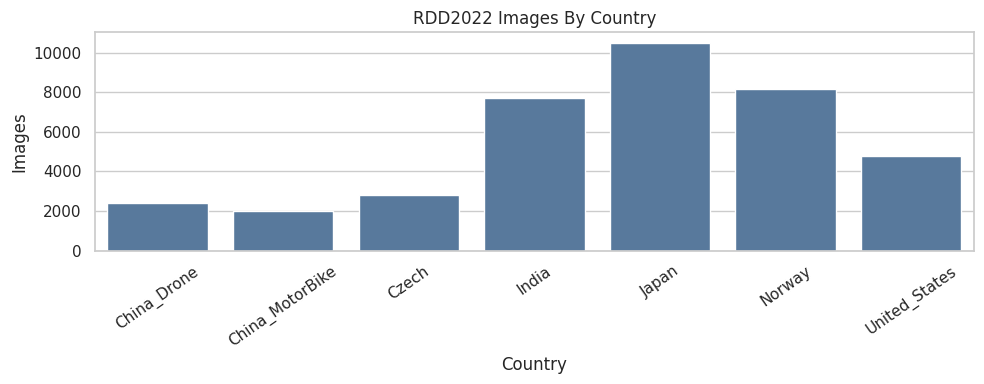

In [8]:
fig, axis = plt.subplots(figsize=(10, 4))
sns.barplot(data=country_summary, x="country", y="images", ax=axis, color="#4C78A8")
axis.set_title("RDD2022 Images By Country")
axis.set_xlabel("Country")
axis.set_ylabel("Images")
axis.tick_params(axis="x", rotation=35)
plt.tight_layout()

## 5. Label Inventory

RDD2022 challenge descriptions often emphasize `D00`, `D10`, `D20`, and `D40`, but some country archives include additional labels. We need to know this before deciding the image-classification target.

In [9]:
label_counts = object_df["label"].value_counts().rename_axis("label").reset_index(name="objects")
label_counts

,label,objects
0,D00,26016
1,D10,11830
2,D20,10617
3,D40,6544
4,D44,5057
5,D50,3581
6,Repair,1046
7,D43,793
8,D01,179
9,D11,45


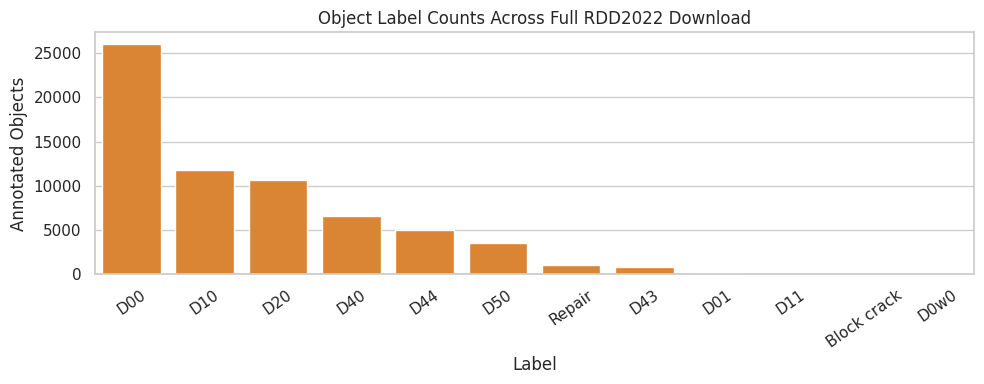

In [10]:
fig, axis = plt.subplots(figsize=(10, 4))
sns.barplot(data=label_counts, x="label", y="objects", ax=axis, color="#F58518")
axis.set_title("Object Label Counts Across Full RDD2022 Download")
axis.set_xlabel("Label")
axis.set_ylabel("Annotated Objects")
axis.tick_params(axis="x", rotation=35)
plt.tight_layout()

In [11]:
label_by_country = pd.crosstab(object_df["country"], object_df["label"])
label_by_country

label,Block crack,D00,D01,D0w0,D10,D11,D20,D40,D43,D44,D50,Repair
country,,,,,,,,,,,,
China_Drone,3,1426,0,0,1263,0,293,86,0,0,0,769
China_MotorBike,0,2678,0,0,1096,0,641,235,0,0,0,277
Czech,0,988,0,0,399,0,161,197,0,0,0,0
India,0,1555,179,1,68,45,2021,3187,57,1062,28,0
Japan,0,4049,0,0,3979,0,6199,2243,736,3995,3553,0
Norway,0,8570,0,0,1730,0,468,461,0,0,0,0
United_States,0,6750,0,0,3295,0,834,135,0,0,0,0


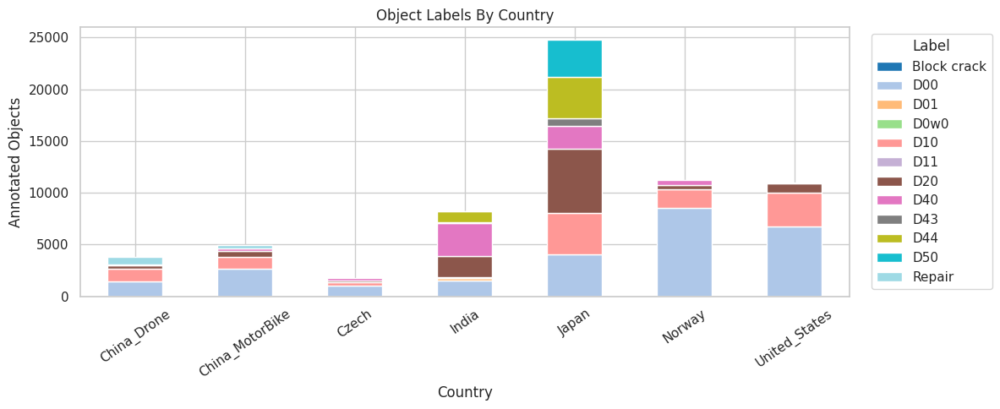

In [12]:
fig, axis = plt.subplots(figsize=(12, 5))
label_by_country.plot(kind="bar", stacked=True, ax=axis, colormap="tab20")
axis.set_title("Object Labels By Country")
axis.set_xlabel("Country")
axis.set_ylabel("Annotated Objects")
axis.tick_params(axis="x", rotation=35)
axis.legend(title="Label", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.tight_layout()

## 6. Image-Level Label Sets

For image classification, the image-level target matters. These cells show how often each image has no labels, one label, or multiple labels.

In [13]:
label_set_counts = image_df["label_set"].value_counts().rename_axis("label_set").reset_index(name="images")
label_set_counts.head(30)

,label_set,images
0,NO_OBJECT,11724
1,D00,6476
2,D00+D10,3153
3,D20,2734
4,D10,2009
5,D40,1231
6,D44,1190
7,D00+D20,974
8,D20+D40,802
9,D20+D44,780


In [14]:
image_type_summary = pd.DataFrame(
    {
        "type": ["no_object", "single_label", "multi_label"],
        "images": [
            int((~image_df["has_object"]).sum()),
            int((image_df["has_object"] & ~image_df["is_multi_label"]).sum()),
            int(image_df["is_multi_label"].sum()),
        ],
    }
)
image_type_summary["pct"] = image_type_summary["images"] / len(image_df)
image_type_summary

,type,images,pct
0,no_object,11724,0.305432
1,single_label,14916,0.388589
2,multi_label,11745,0.305979


/tmp/ipykernel_103456/1005681878.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=image_type_summary, x="type", y="images", ax=axis, palette="Set2")


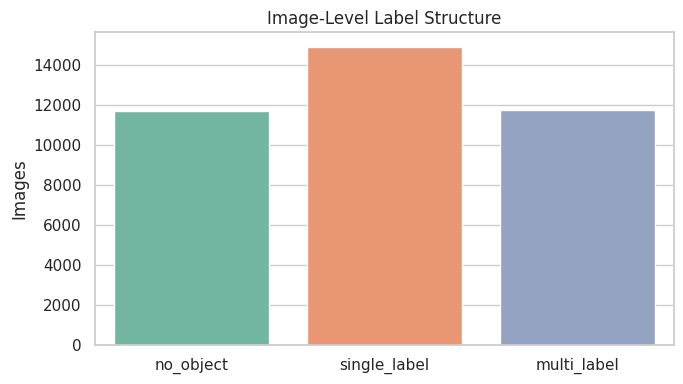

In [15]:
fig, axis = plt.subplots(figsize=(7, 4))
sns.barplot(data=image_type_summary, x="type", y="images", ax=axis, palette="Set2")
axis.set_title("Image-Level Label Structure")
axis.set_xlabel("")
axis.set_ylabel("Images")
plt.tight_layout()

## 7. Label Co-Occurrence

If many labels co-occur in the same image, multi-label classification may be more faithful than forcing a single class.

In [16]:
all_labels = sorted(object_df["label"].unique())
cooccurrence = pd.DataFrame(0, index=all_labels, columns=all_labels, dtype=int)

for labels in image_df["unique_labels"]:
    for first in labels:
        for second in labels:
            cooccurrence.loc[first, second] += 1

cooccurrence

,Block crack,D00,D01,D0w0,D10,D11,D20,D40,D43,D44,D50,Repair
Block crack,3,1,0,0,1,0,1,0,0,0,0,1
D00,1,13548,10,0,4317,4,2215,870,126,1036,586,195
D01,0,10,118,0,1,26,2,19,0,11,1,0
D0w0,0,0,0,1,0,0,0,0,0,0,0,0
D10,1,4317,1,0,7709,1,1605,385,73,703,538,118
D11,0,4,26,0,1,36,0,7,0,2,1,0
D20,1,2215,2,0,1605,0,8412,1543,154,1487,1118,117
D40,0,870,19,0,385,7,1543,3674,23,282,441,94
D43,0,126,0,0,73,0,154,23,753,124,240,0
D44,0,1036,11,0,703,2,1487,282,124,4079,624,0


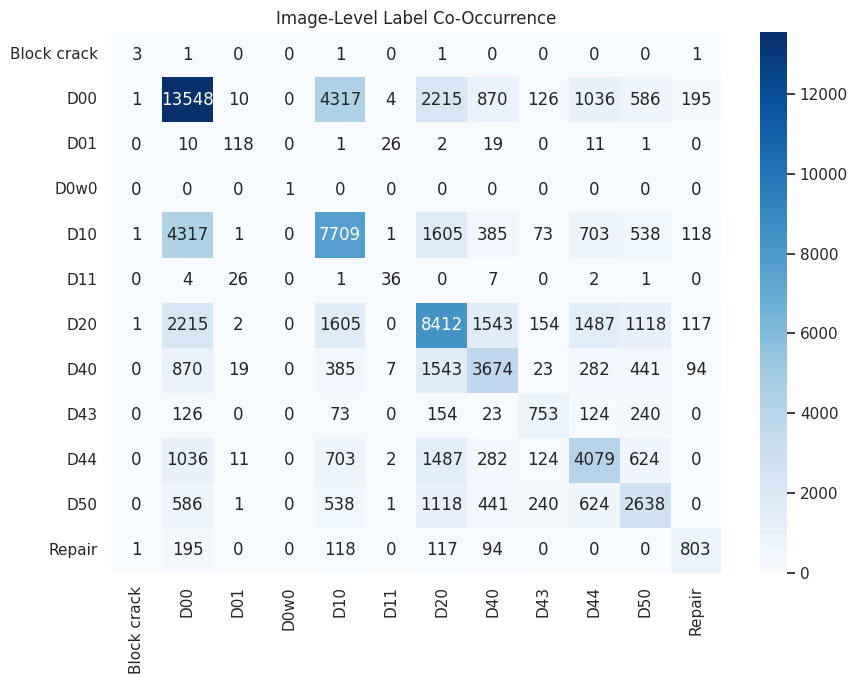

In [17]:
fig, axis = plt.subplots(figsize=(9, 7))
sns.heatmap(cooccurrence, cmap="Blues", annot=True, fmt="d", ax=axis)
axis.set_title("Image-Level Label Co-Occurrence")
plt.tight_layout()

## 8. Bounding Box Size And Position

Even though the next task is image classification, bounding boxes help us understand whether damage is tiny, large, centered, or sparse. This affects how much signal a whole-image classifier can learn.

In [18]:
object_df[["label", "box_width", "box_height", "box_area_fraction"]].describe()

,box_width,box_height,box_area_fraction
count,65712.000000,65712.000000,65712.000000
mean,165.876461,121.283467,0.046118
std,182.768999,114.977810,0.079648
min,0.000000,1.000000,0.000000
25%,58.410000,39.000000,0.004825
50%,110.000000,87.000000,0.015176
75%,204.000000,168.000000,0.049783
max,2375.110000,1105.000000,0.940847


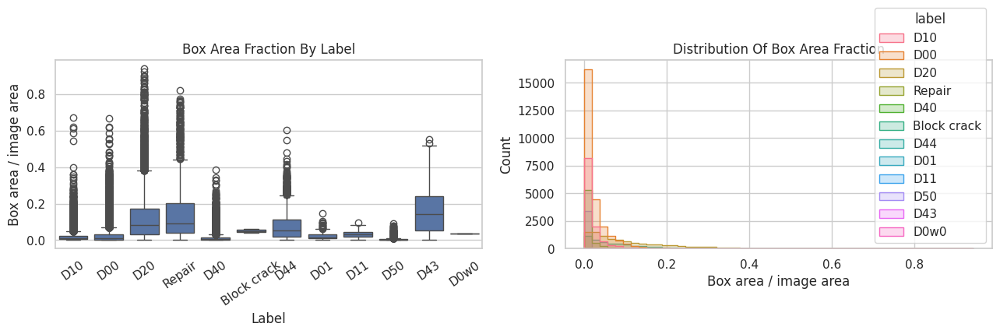

In [19]:
fig, axes = plt.subplots(1, 2, figsize=(13, 4))
sns.boxplot(data=object_df, x="label", y="box_area_fraction", ax=axes[0])
axes[0].set_title("Box Area Fraction By Label")
axes[0].set_xlabel("Label")
axes[0].set_ylabel("Box area / image area")
axes[0].tick_params(axis="x", rotation=35)

sns.histplot(data=object_df, x="box_area_fraction", hue="label", bins=50, ax=axes[1], element="step")
axes[1].set_title("Distribution Of Box Area Fraction")
axes[1].set_xlabel("Box area / image area")
plt.tight_layout()

## 9. Visualization Helpers

The functions below display images with annotation boxes. Use them to inspect countries, labels, empty images, and multi-label examples.

In [20]:
LABEL_COLORS = {
    "D00": "red",
    "D10": "orange",
    "D20": "deepskyblue",
    "D40": "lime",
    "D43": "violet",
    "D44": "magenta",
    "D50": "cyan",
    "Repair": "yellow",
}


def annotation_rows_for_image(image_path: Path) -> pd.DataFrame:
    return object_df[object_df["image_path"] == image_path]


def draw_annotated_image(image_row: pd.Series, max_size: int = 700) -> Image.Image:
    image = Image.open(image_row["image_path"]).convert("RGB")
    scale = min(max_size / max(image.size), 1.0)
    if scale != 1.0:
        image = image.resize((int(image.width * scale), int(image.height * scale)))

    draw = ImageDraw.Draw(image)
    rows = annotation_rows_for_image(image_row["image_path"])
    for _, obj in rows.iterrows():
        color = LABEL_COLORS.get(obj["label"], "white")
        box = [obj["xmin"] * scale, obj["ymin"] * scale, obj["xmax"] * scale, obj["ymax"] * scale]
        draw.rectangle(box, outline=color, width=3)
        draw.text((box[0] + 3, box[1] + 3), obj["label"], fill=color)

    return image


def show_image_grid(rows: pd.DataFrame, title: str, n: int = 8, seed: int = 7) -> None:
    if rows.empty:
        print(f"No images found for: {title}")
        return

    sample = rows.sample(n=min(n, len(rows)), random_state=seed)
    columns = min(4, len(sample))
    rows_count = (len(sample) + columns - 1) // columns
    fig, axes = plt.subplots(rows_count, columns, figsize=(4 * columns, 3.5 * rows_count))
    axes = list(axes.ravel()) if hasattr(axes, "ravel") else [axes]

    for axis, (_, image_row) in zip(axes, sample.iterrows()):
        annotated = draw_annotated_image(image_row, max_size=500)
        axis.imshow(annotated)
        axis.set_title(f"{image_row['country']} | {image_row['label_set']}", fontsize=9)
        axis.axis("off")

    for axis in axes[len(sample):]:
        axis.axis("off")

    fig.suptitle(title, y=1.02, fontsize=14)
    plt.tight_layout()

## 10. Random Images From Each Country

Look for domain shift: camera angle, road texture, lighting, country-specific annotation habits, and damage visibility.

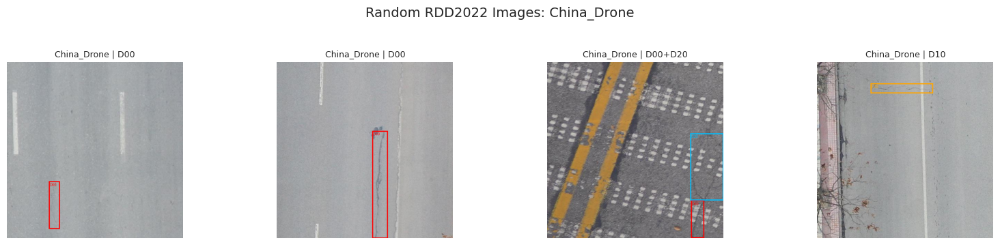

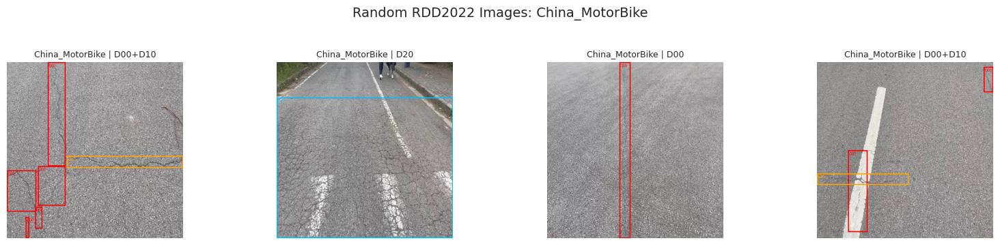

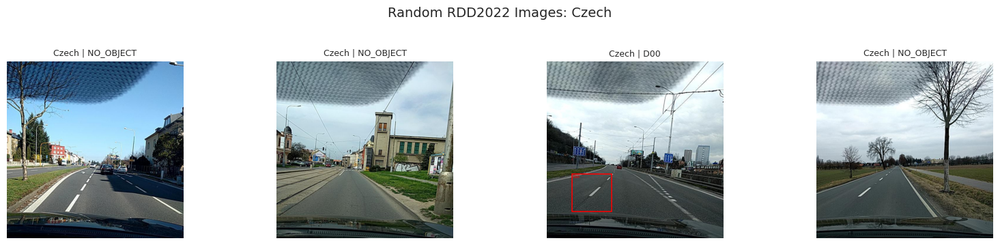

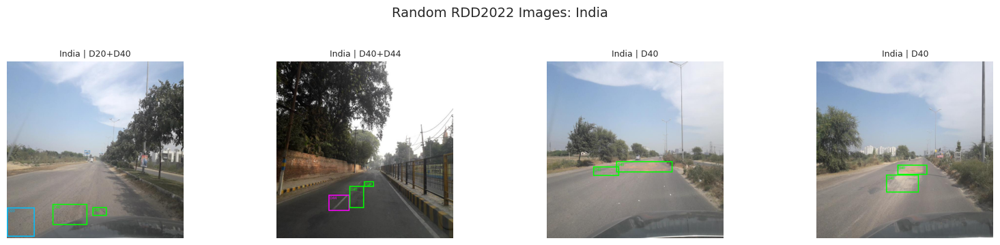

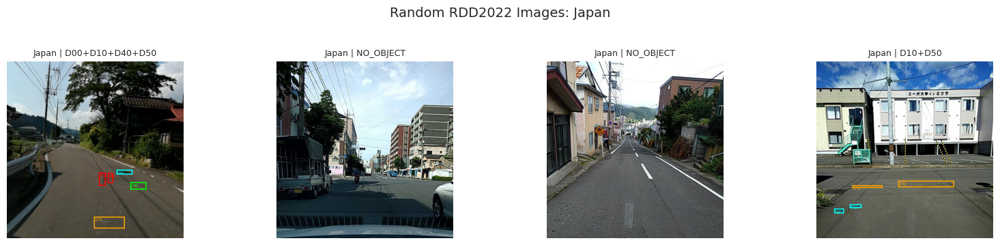

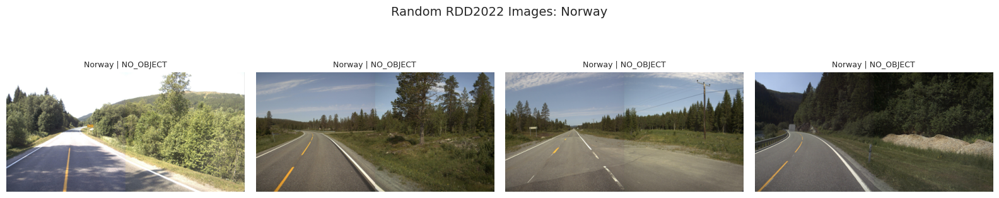

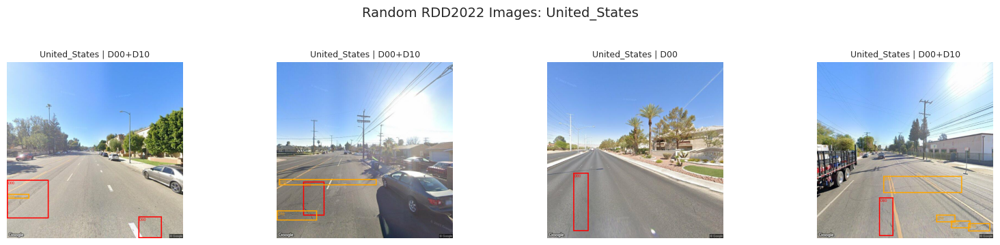

In [21]:
for country in countries:
    show_image_grid(
        image_df[image_df["country"] == country],
        title=f"Random RDD2022 Images: {country}",
        n=4,
        seed=11,
    )

## 11. Random Images For Specific Labels

Use this to visually inspect the meaning and consistency of each class.

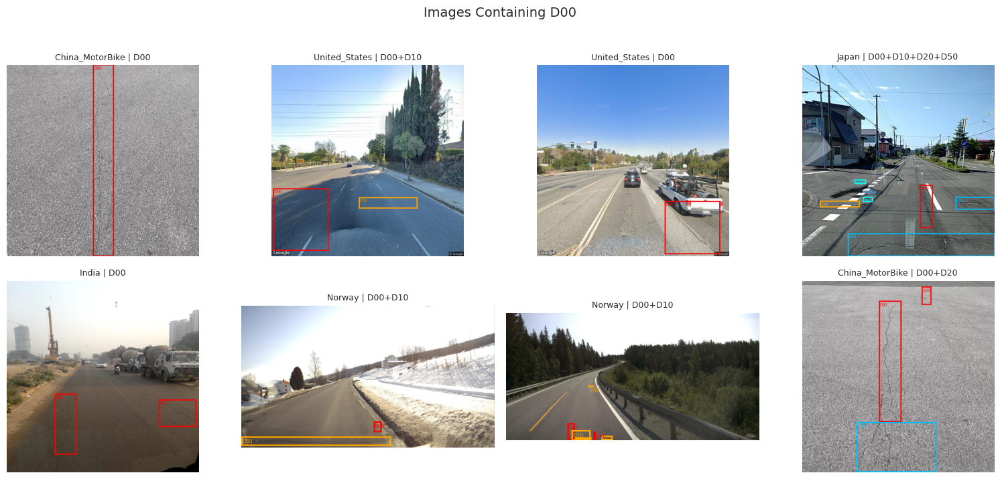

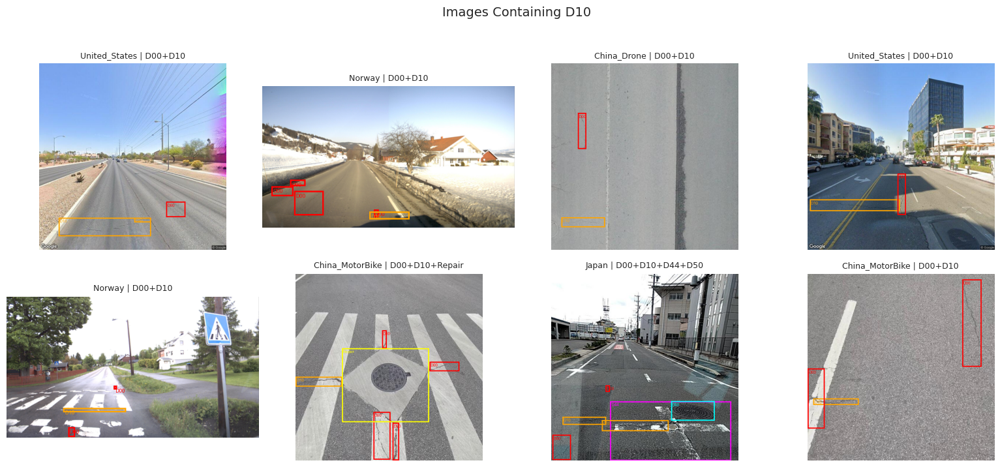

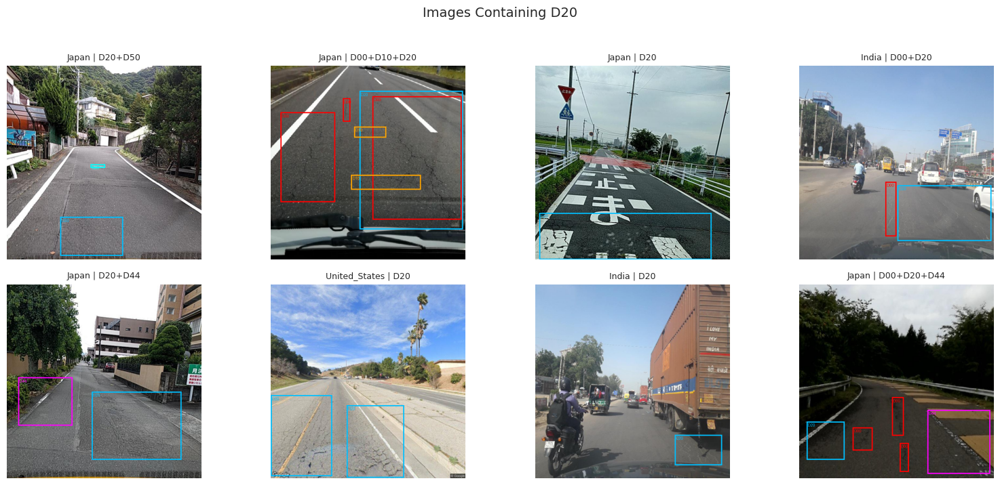

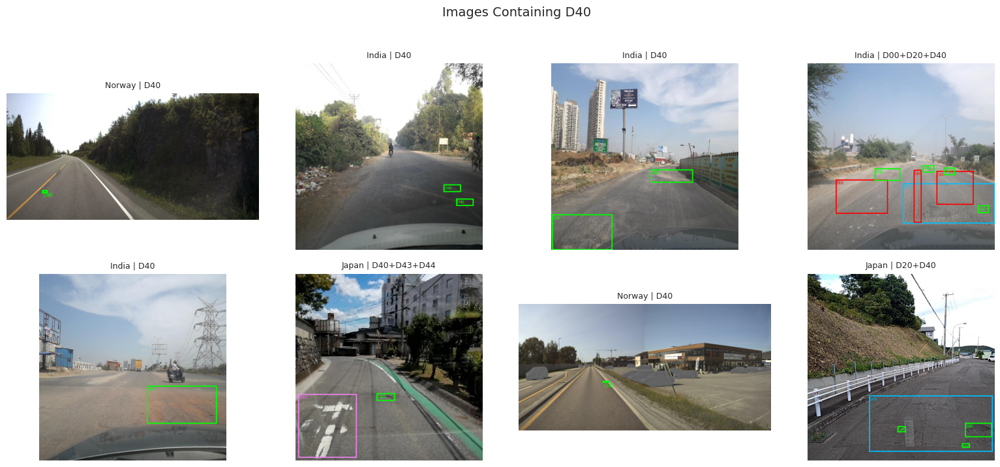

In [22]:
def images_containing_label(label: str) -> pd.DataFrame:
    mask = image_df["unique_labels"].apply(lambda labels: label in labels)
    return image_df[mask]


for label in ["D00", "D10", "D20", "D40"]:
    show_image_grid(images_containing_label(label), title=f"Images Containing {label}", n=8, seed=23)

## 12. Empty And Multi-Label Examples

These are especially important for deciding whether we want binary, single-label, or multi-label image classification.

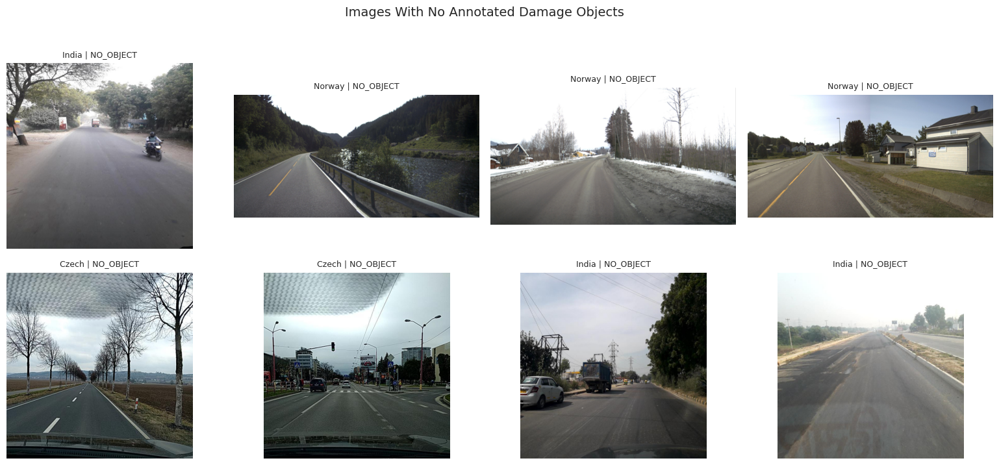

In [23]:
show_image_grid(
    image_df[~image_df["has_object"]],
    title="Images With No Annotated Damage Objects",
    n=8,
    seed=41,
)

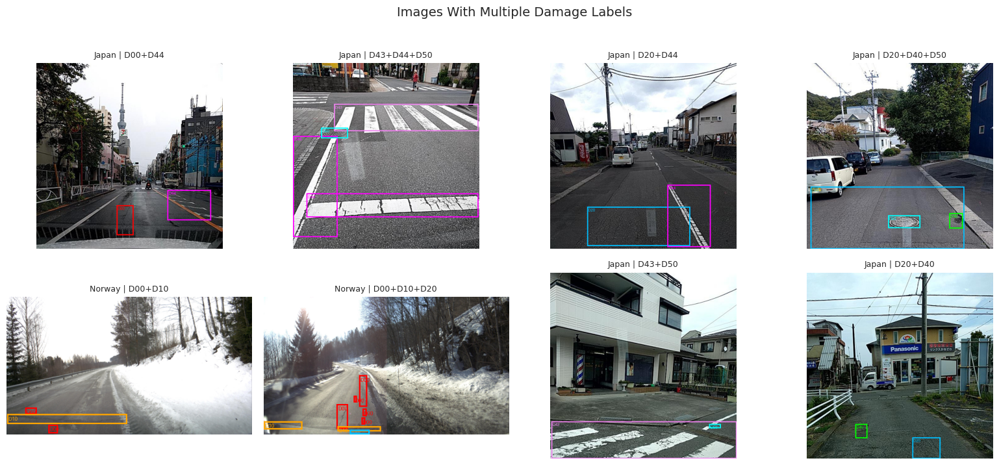

In [24]:
show_image_grid(
    image_df[image_df["is_multi_label"]],
    title="Images With Multiple Damage Labels",
    n=8,
    seed=43,
)

## 13. Candidate Image-Classification Dataset Definitions

Before training, we should choose one of these formulations:

1. **Binary classification**: `damage` vs `no_damage`.
2. **Single-label four-class classification**: keep images with exactly one of `D00`, `D10`, `D20`, `D40`.
3. **Single-label dominant-class classification**: choose the most frequent or largest-area label per image.
4. **Multi-label classification**: predict a vector of labels per image.

The cells below estimate how many images each definition would keep.

In [25]:
CORE_LABELS = {"D00", "D10", "D20", "D40"}

binary_images = len(image_df)
single_core_mask = image_df["unique_labels"].apply(lambda labels: len(labels) == 1 and labels[0] in CORE_LABELS)
multi_core_mask = image_df["unique_labels"].apply(lambda labels: bool(set(labels) & CORE_LABELS))

candidate_definitions = pd.DataFrame(
    [
        {"definition": "binary_damage_vs_no_damage", "images": binary_images},
        {"definition": "single_label_exactly_one_core_label", "images": int(single_core_mask.sum())},
        {"definition": "multi_label_any_core_label", "images": int(multi_core_mask.sum())},
        {"definition": "all_non_empty_labels", "images": int(image_df["has_object"].sum())},
    ]
)
candidate_definitions["pct_of_all_images"] = candidate_definitions["images"] / len(image_df)
candidate_definitions

,definition,images,pct_of_all_images
0,binary_damage_vs_no_damage,38385,1.000000
1,single_label_exactly_one_core_label,12450,0.324345
2,multi_label_any_core_label,23767,0.619174
3,all_non_empty_labels,26661,0.694568


## 14. Country-Based Splits

For realistic generalization, a country-based split is more honest than random image splitting. It tests whether the model learned road-damage visual cues rather than memorizing country/camera/road-texture patterns.

In [26]:
candidate_split = {
    "train": ["China_Drone", "China_MotorBike", "Czech", "India"],
    "validation": ["United_States"],
    "test": ["Japan", "Norway"],
}

split_rows = []
for split_name, split_countries in candidate_split.items():
    split_images = image_df[image_df["country"].isin(split_countries)]
    split_objects = object_df[object_df["country"].isin(split_countries)]
    row = {
        "split": split_name,
        "countries": ", ".join(split_countries),
        "images": len(split_images),
        "images_with_objects": int(split_images["has_object"].sum()),
        "empty_images": int((~split_images["has_object"]).sum()),
        "multi_label_images": int(split_images["is_multi_label"].sum()),
    }
    for label in sorted(object_df["label"].unique()):
        row[label] = int((split_objects["label"] == label).sum())
    split_rows.append(row)

candidate_split_df = pd.DataFrame(split_rows)
candidate_split_df

,split,countries,images,images_with_objects,empty_images,multi_label_images,Block crack,D00,D01,D0w0,D10,D11,D20,D40,D43,D44,D50,Repair
0,train,"China_Drone, China_MotorBike, Czech, India",14913,9230,5683,3032,3,6647,179,1,2826,45,3116,3705,57,1062,28,1046
1,validation,United_States,4805,4805,0,2103,0,6750,0,0,3295,0,834,135,0,0,0,0
2,test,"Japan, Norway",18667,12626,6041,6610,0,12619,0,0,5709,0,6667,2704,736,3995,3553,0


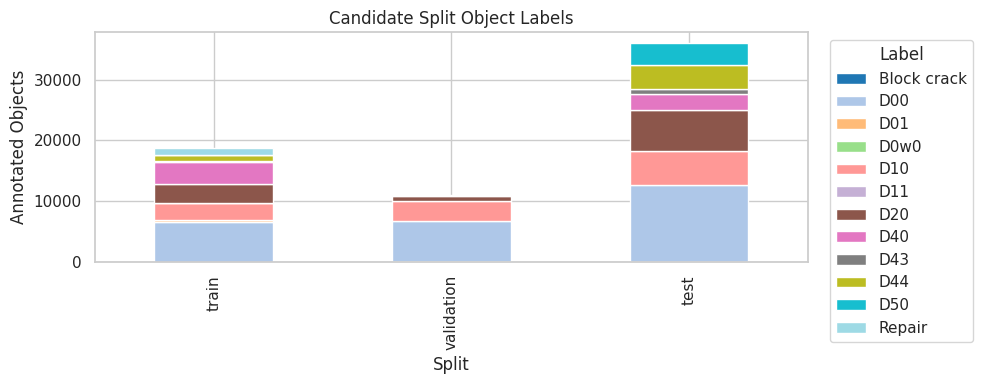

In [27]:
fig, axis = plt.subplots(figsize=(10, 4))
plot_df = candidate_split_df.set_index("split")[[label for label in sorted(object_df["label"].unique())]]
plot_df.plot(kind="bar", stacked=True, ax=axis, colormap="tab20")
axis.set_title("Candidate Split Object Labels")
axis.set_xlabel("Split")
axis.set_ylabel("Annotated Objects")
axis.legend(title="Label", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.tight_layout()

## 15. Leave-One-Country-Out Fold Sketch

This is a stronger option for model selection: each fold tests generalization to one unseen country. We can use this idea later when implementing cross-validation.

In [28]:
fold_rows = []
for test_country in countries:
    train_countries = [country for country in countries if country != test_country]
    fold_rows.append(
        {
            "fold": f"test_{test_country}",
            "train_countries": ", ".join(train_countries),
            "test_country": test_country,
            "train_images": int(image_df[image_df["country"].isin(train_countries)].shape[0]),
            "test_images": int(image_df[image_df["country"] == test_country].shape[0]),
        }
    )

pd.DataFrame(fold_rows)

,fold,train_countries,test_country,train_images,test_images
0,test_China_Drone,"China_MotorBike, Czech, India, Japan, Norway, ...",China_Drone,35984,2401
1,test_China_MotorBike,"China_Drone, Czech, India, Japan, Norway, Unit...",China_MotorBike,36408,1977
2,test_Czech,"China_Drone, China_MotorBike, India, Japan, No...",Czech,35556,2829
3,test_India,"China_Drone, China_MotorBike, Czech, Japan, No...",India,30679,7706
4,test_Japan,"China_Drone, China_MotorBike, Czech, India, No...",Japan,27879,10506
5,test_Norway,"China_Drone, China_MotorBike, Czech, India, Ja...",Norway,30224,8161
6,test_United_States,"China_Drone, China_MotorBike, Czech, India, Ja...",United_States,33580,4805


## 16. Notes And Decisions

Use this section as we inspect the dataset.

Questions to answer before training:

- Do we want binary, single-label, or multi-label image classification?
- Do we include labels beyond `D00`, `D10`, `D20`, `D40`?
- Do empty/no-object images become a `no_damage` class, or are they excluded?
- Should train/validation/test be country-held-out or random within country?
- Which metric should rank the top 3 models: accuracy, macro F1, balanced accuracy, or multi-label F1?

Initial engineering instinct: use country-aware splits and report macro metrics, because class imbalance and country/domain shift are both substantial.